In [1]:
import os
import IPython
import librosa as lr
import numpy as np
from datetime import datetime
from packaging import version
import tensorboard
import keras
from keras import layers
from keras import regularizers
import tensorflow as tf
import matplotlib.pyplot as plt
from librosa import display
from tensorflow.keras.layers import Conv2D,MaxPooling2D,UpSampling2D,Flatten,Dense,Activation,Conv2DTranspose
import time
from sklearn import preprocessing
from scipy.fft import fft, fftfreq

In [2]:
path = 'C:/Users/erikv/Desktop/IP/samples/' #path where the samples are stored'''
dirs = os.listdir(path) #open the directory using os library'''

def rosaspec(sound, NFFT): #defined functions for extracting the spectogram of a sound wave'''
    sound = np.concatenate((np.zeros(int(NFFT/2)),sound,np.zeros(int(NFFT/2))))
    spec_c = lr.stft(sound, n_fft=NFFT, hop_length=int(NFFT/2), win_length=None, window='hann', center=False)
    return np.concatenate((np.expand_dims(np.real(spec_c),2),np.expand_dims(np.imag(spec_c),2)),axis=2)

def irosaspec(spec,NFFT): #defined function for extracting a soundwave from a spectogram'''
    spec_c = spec[:,:,0].squeeze() + 1j* spec[:,:,1].squeeze()
    return lr.istft(spec_c, hop_length=int(NFFT/2), win_length=None, window='hann', center=False)[int(NFFT/2):-int(NFFT/2)]

autoencoder = tf.keras.models.load_model('autoencoder_v26')
encoder = autoencoder.get_layer('encoder')
decoder = autoencoder.get_layer('decoder')
visualizer = tf.keras.models.load_model('visualizer')
shortener = visualizer.get_layer('shortener')
reshaper = visualizer.get_layer('reshaper')
def fftpl(audio,sr):
    n = len(audio)
    T = 1/sr
    yf = fft(audio)
    xf = fftfreq(n,T)[:n//2]
    fig,ax = plt.subplots()
    ax.plot(xf,2.0/n * np.abs(yf[:n//2]))
    plt.grid()
    plt.xlabel("frequency")
    plt.ylabel("magnitude")
    plt.title("FFT")
    return plt.show()
print ('done')

done


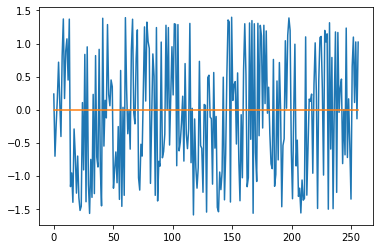

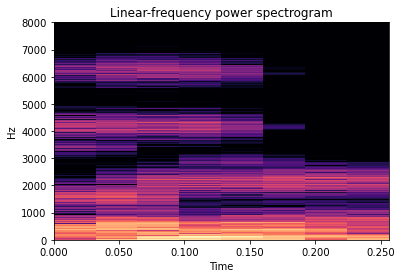

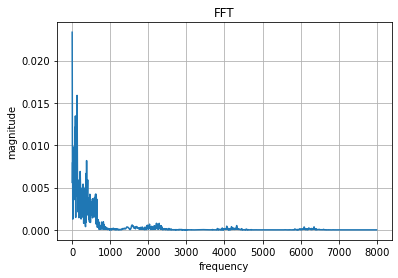

In [4]:
NFFT =  int(1022/8)
sroriginal1 = 16000
from numpy import linspace as lin
X = lin(0,1,256) #HEre I create a line of 256 points
probe = 3*np.random.rand(256)-1.6# Here I use a given function (in this case a sine function)
#for i in range*(255,256): #here I can modify certain values to follow a different function
    #probe[i] = -2*np.cos(X[i])
plt.plot(lin(0,256,256),probe)
plt.plot(lin(0,256,256),lin(0,0,256))

plt.show()

shortened_vector = probe #then i use this modified vector and run it through all the decoders and the inverse 
                         #spectogram function
reshaped_vector = np.array([reshaper(np.array([probe]))])
decoded_arrayfromvect = np.array([decoder(reshaped_vector[0])])
decoded_audiofromvect = irosaspec(decoded_arrayfromvect[0,0],NFFT)

y, sr = decoded_audiofromvect, sroriginal1
D = lr.amplitude_to_db(np.abs(lr.stft(y)), ref=np.max)
img = lr.display.specshow(D, y_axis='linear', x_axis='time',                               sr=sr)
plt.title('Linear-frequency power spectrogram')
fftpl(y,sr)
plt.show()

IPython.display.display(IPython.display.Audio(decoded_audiofromvect,rate = sroriginal1))


C:\Users\erikv\AppData\Local\Temp/ipykernel_14256/2010936895.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots()


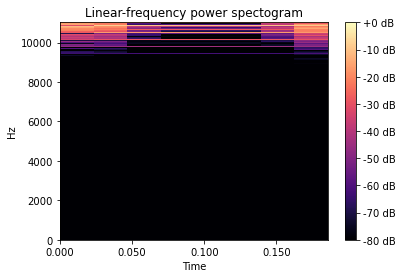

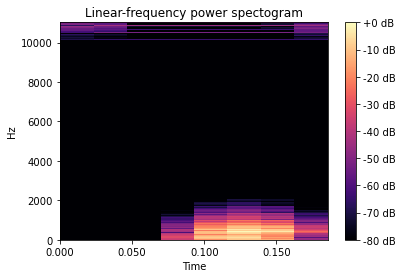

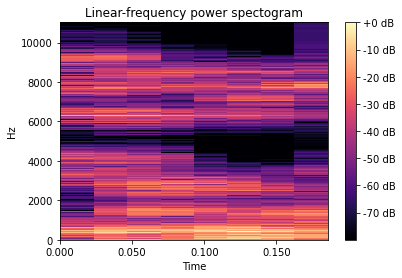

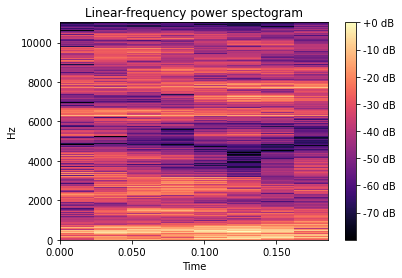

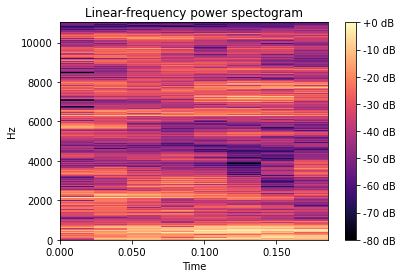

...

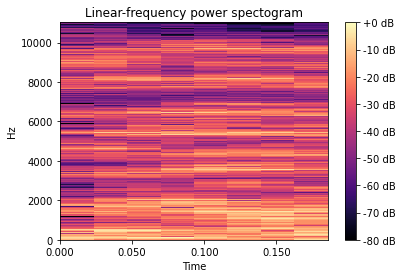

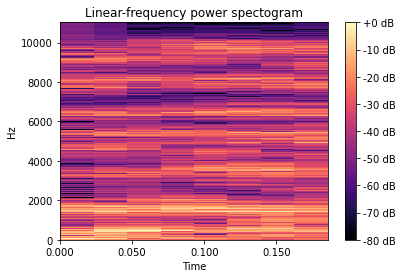

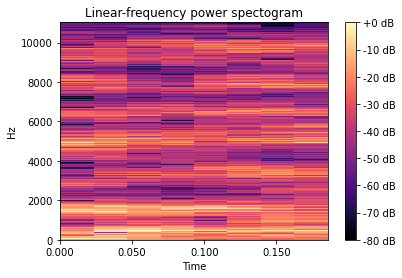

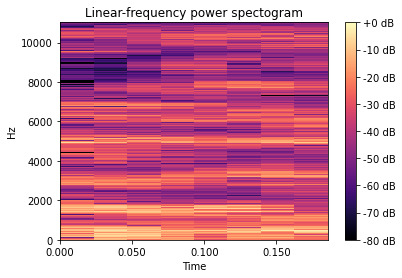

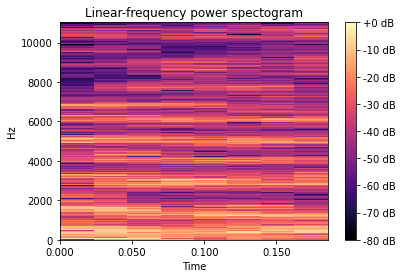

In [5]:
from numpy import linspace as lin
savepath = 'C:/Users/erikv/Desktop/IP/spectograms'
my_path = os.path.abspath(savepath)
freq = lin(1,100,100)
for freq in freq:

    X = lin(0,1,256) #HEre I create a line of 256 points
    probe = 100*np.cos(freq*X) # Here I use a given function (in this case a sine function)
    #for i in range*(255,256): #here I can modify certain values to follow a different function
        #probe[i] = -2*np.cos(X[i])
    #plt.plot(lin(0,256,256),probe)
    #plt.plot(lin(0,256,256),lin(0,0,256))


    shortened_vector = probe #then i use this modified vector and run it through all the decoders and the inverse 
                             #spectogram function
    reshaped_vector = np.array([reshaper(np.array([probe]))])
    decoded_arrayfromvect = np.array([decoder(reshaped_vector[0])])
    decoded_audiofromvect = irosaspec(decoded_arrayfromvect[0,0],NFFT)

    y, sr = decoded_audiofromvect, sroriginal1
    D = lr.amplitude_to_db(np.abs(lr.stft(y)), ref=np.max)
    fig, ax = plt.subplots()
    img = lr.display.specshow(D, x_axis='time', y_axis='linear', ax=ax)
    ax.set(title='Linear-frequency power spectogram')
    fig.colorbar(img, ax=ax, format="%+2.f dB")
    my_file = '4sin'+str(freq)+'.png'
    plt.savefig(os.path.join(my_path, my_file))

In [327]:
from numpy import linspace as lin
savepath = 'C:/Users/erikv/Desktop/IP/spectograms'
my_path = os.path.abspath(savepath)
slope = np.linspace(0,3,100)
for m in slope:

    X = lin(0,1,256) #HEre I create a line of 256 points
    probe = -2*X +m# Here I use a given function (in this case a sine function)
    #for i in range*(255,256): #here I can modify certain values to follow a different function
        #probe[i] = -2*np.cos(X[i])
    #plt.plot(lin(0,256,256),probe)
    #plt.plot(lin(0,256,256),lin(0,0,256))


    shortened_vector = probe #then i use this modified vector and run it through all the decoders and the inverse 
                             #spectogram function
    reshaped_vector = np.array([reshaper(np.array([probe]))])
    decoded_arrayfromvect = np.array([decoder(reshaped_vector[0])])
    decoded_audiofromvect = irosaspec(decoded_arrayfromvect[0,0],NFFT)

    y, sr = decoded_audiofromvect, sroriginal1
    D = lr.amplitude_to_db(np.abs(lr.stft(y)), ref=np.max)
    fig, ax = plt.subplots()
    img = lr.display.specshow(D, x_axis='time', y_axis='linear', ax=ax)
    ax.set(title='Linear-frequency power spectogram')
    fig.colorbar(img, ax=ax, format="%+2.f dB")
    my_file ='-2x+'+str(int(m*100))+'.png'
    plt.savefig(os.path.join(my_path, my_file))

ValueError: Input 0 of layer dense_3 is incompatible with the layer: expected axis -1 of input shape to have value 256 but received input with shape (1, 256, 100)

C:\Users\erikv\AppData\Local\Temp/ipykernel_19288/381511794.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots()


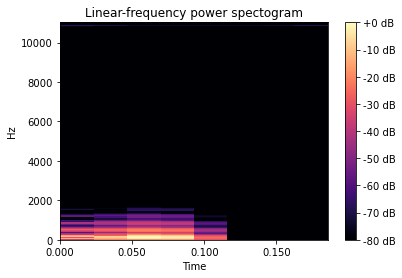

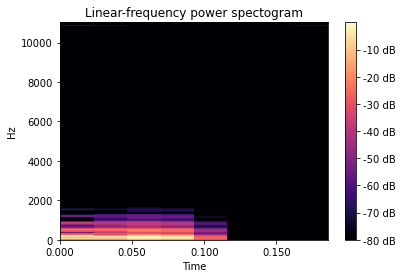

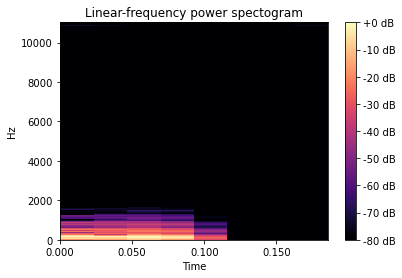

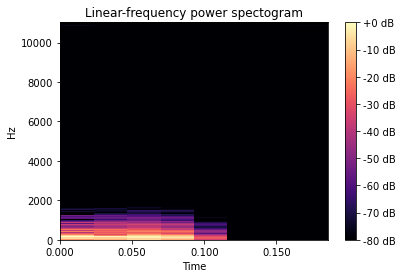

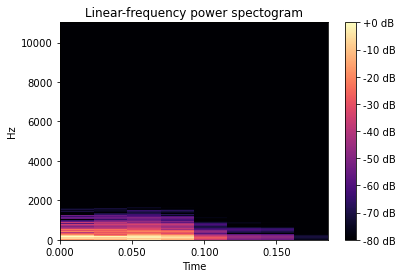

...

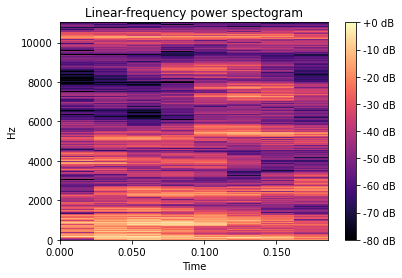

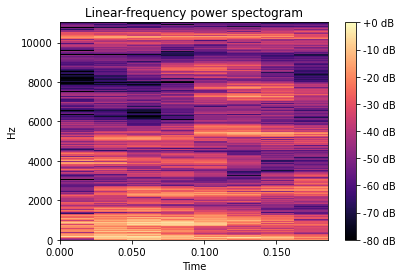

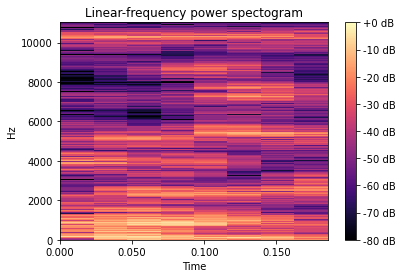

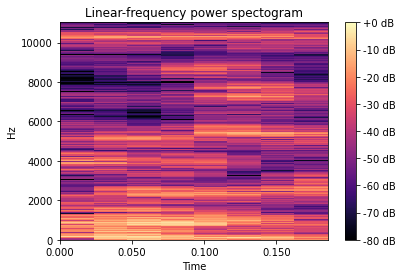

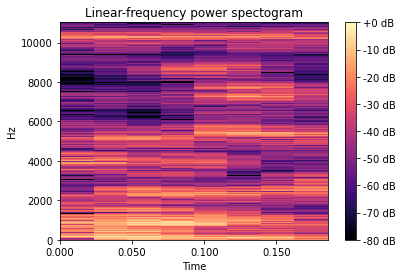

In [331]:
from numpy import linspace as lin
savepath = 'C:/Users/erikv/Desktop/IP/spectograms'
my_path = os.path.abspath(savepath)
slope = np.linspace(0,-3,100)
for m in slope:

    X = lin(0,1,256) #HEre I create a line of 256 points
    probe = lin(m,m,256)# Here I use a given function (in this case a sine function)
    #for i in range*(255,256): #here I can modify certain values to follow a different function
        #probe[i] = -2*np.cos(X[i])
    #plt.plot(lin(0,256,256),probe)
    #plt.plot(lin(0,256,256),lin(0,0,256))


    shortened_vector = probe #then i use this modified vector and run it through all the decoders and the inverse 
                             #spectogram function
    reshaped_vector = np.array([reshaper(np.array([probe]))])
    decoded_arrayfromvect = np.array([decoder(reshaped_vector[0])])
    decoded_audiofromvect = irosaspec(decoded_arrayfromvect[0,0],NFFT)

    y, sr = decoded_audiofromvect, sroriginal1
    D = lr.amplitude_to_db(np.abs(lr.stft(y)), ref=np.max)
    fig, ax = plt.subplots()
    img = lr.display.specshow(D, x_axis='time', y_axis='linear', ax=ax)
    ax.set(title='Linear-frequency power spectogram')
    fig.colorbar(img, ax=ax, format="%+2.f dB")
    my_file =str(int(m*100))+'.png'
    plt.savefig(os.path.join(my_path, my_file))

C:\Users\erikv\AppData\Local\Temp/ipykernel_19288/1714201854.py:22: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots()


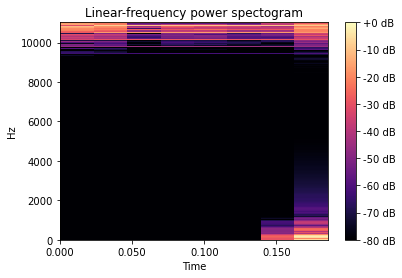

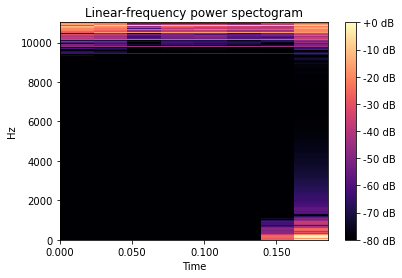

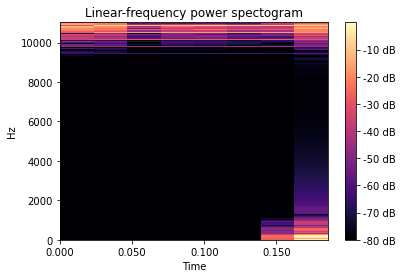

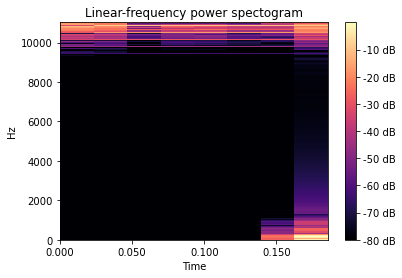

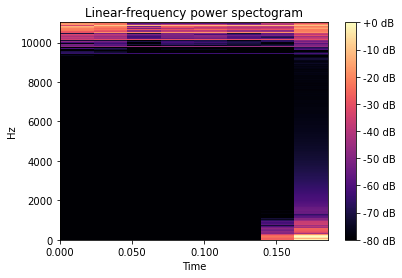

...

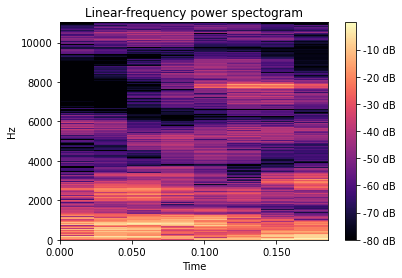

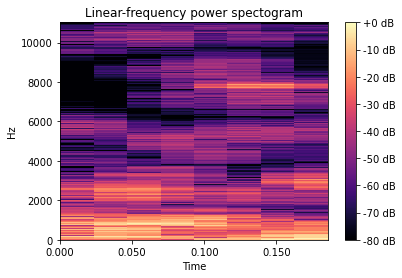

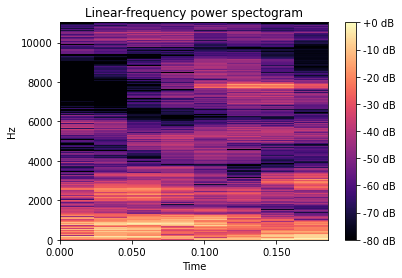

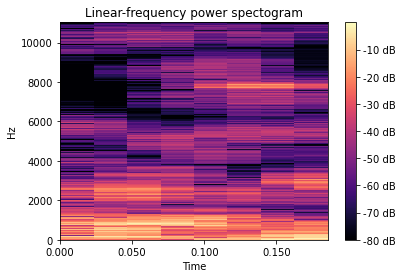

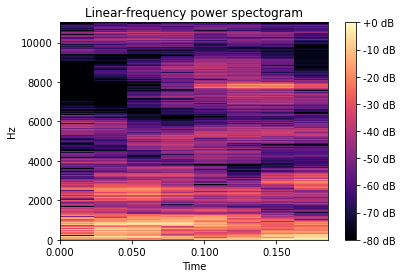

In [344]:
from numpy import linspace as lin
savepath = 'C:/Users/erikv/Desktop/IP/spectograms'
my_path = os.path.abspath(savepath)
pos = np.linspace(0,3,100)
X = probe = 3*np.random.rand(256)
for m in pos:
    probe = X - m# Here I use a given function (in this case a sine function)
    #for i in range*(255,256): #here I can modify certain values to follow a different function
        #probe[i] = -2*np.cos(X[i])
    #plt.plot(lin(0,256,256),probe)
    #plt.plot(lin(0,256,256),lin(0,0,256))


    shortened_vector = probe #then i use this modified vector and run it through all the decoders and the inverse 
                             #spectogram function
    reshaped_vector = np.array([reshaper(np.array([probe]))])
    decoded_arrayfromvect = np.array([decoder(reshaped_vector[0])])
    decoded_audiofromvect = irosaspec(decoded_arrayfromvect[0,0],NFFT)

    y, sr = decoded_audiofromvect, sroriginal1
    D = lr.amplitude_to_db(np.abs(lr.stft(y)), ref=np.max)
    fig, ax = plt.subplots()
    img = lr.display.specshow(D, x_axis='time', y_axis='linear', ax=ax)
    ax.set(title='Linear-frequency power spectogram')
    fig.colorbar(img, ax=ax, format="%+2.f dB")
    my_file ='random offset '+str(int(m*100))+'.png'
    plt.savefig(os.path.join(my_path, my_file))

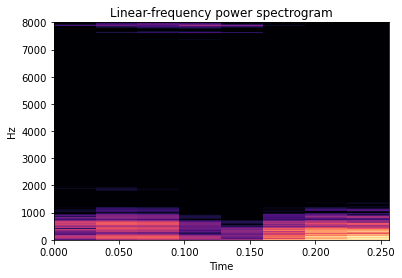

In [351]:
shortened_vector = X-1.2 #then i use this modified vector and run it through all the decoders and the inverse 
                         #spectogram function
reshaped_vector = np.array([reshaper(np.array([shortened_vector]))])
decoded_arrayfromvect = np.array([decoder(reshaped_vector[0])])
decoded_audiofromvect = irosaspec(decoded_arrayfromvect[0,0],NFFT)

y, sr = decoded_audiofromvect, sroriginal1
D = lr.amplitude_to_db(np.abs(lr.stft(y)), ref=np.max)
img = lr.display.specshow(D, y_axis='linear', x_axis='time',                               sr=sr)
plt.title('Linear-frequency power spectrogram')
plt.show()

IPython.display.display(IPython.display.Audio(decoded_audiofromvect,rate = sroriginal1))


C:\Users\erikv\AppData\Local\Temp/ipykernel_12496/3010969759.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots()


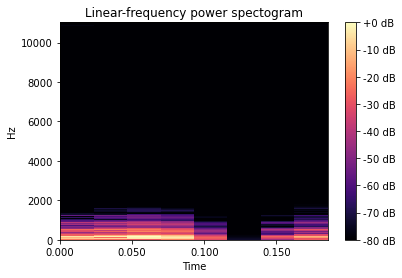

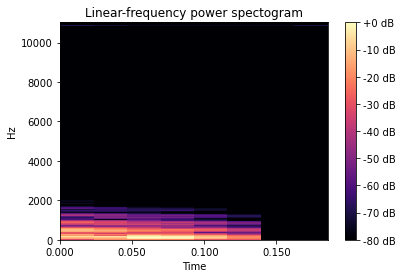

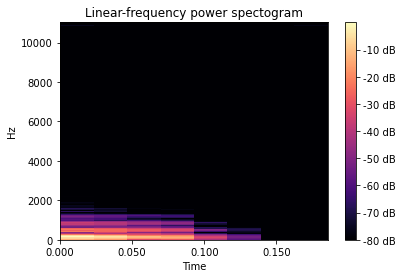

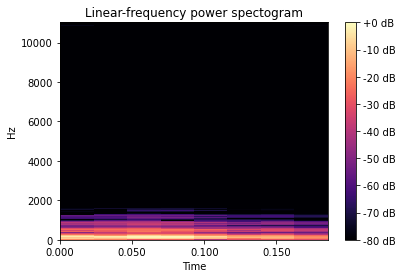

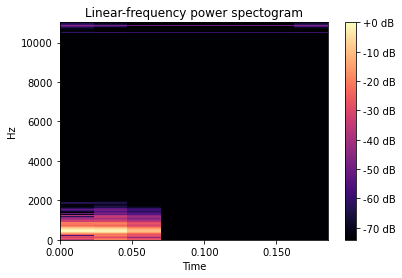

...

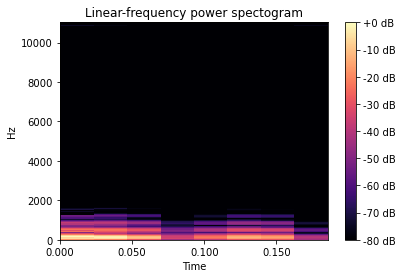

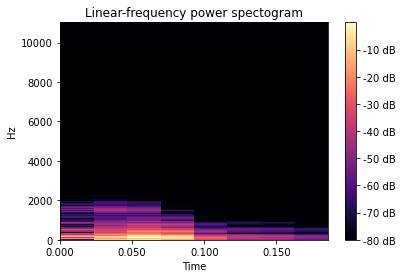

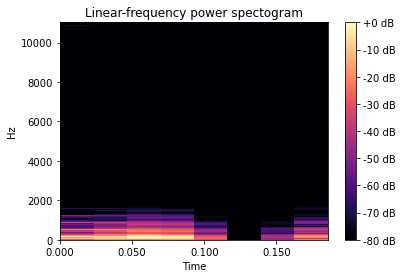

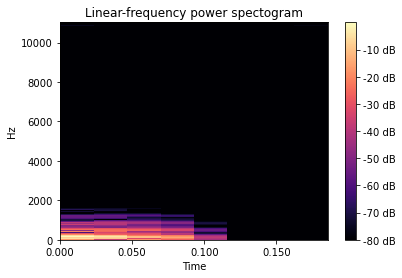

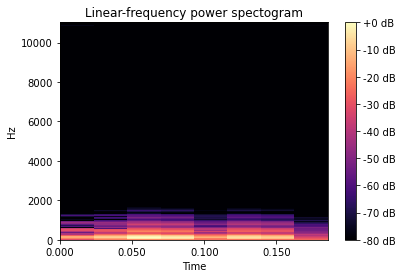

In [16]:
from numpy import linspace as lin
savepath = 'C:/Users/erikv/Desktop/IP/spectograms'
my_path = os.path.abspath(savepath)
pos = -2
X = lin(0,0,256)
for m in range(256):
    probe = lin(0,0,256)
    probe[m]=pos# Here I use a given function (in this case a sine function)
    #for i in range*(255,256): #here I can modify certain values to follow a different function
        #probe[i] = -2*np.cos(X[i])
    #plt.plot(lin(0,256,256),probe)
    #plt.plot(lin(0,256,256),lin(0,0,256))


    shortened_vector = probe #then i use this modified vector and run it through all the decoders and the inverse 
                             #spectogram function
    reshaped_vector = np.array([reshaper(np.array([probe]))])
    decoded_arrayfromvect = np.array([decoder(reshaped_vector[0])])
    decoded_audiofromvect = irosaspec(decoded_arrayfromvect[0,0],NFFT)

    y, sr = decoded_audiofromvect, sroriginal1
    D = lr.amplitude_to_db(np.abs(lr.stft(y)), ref=np.max)
    fig, ax = plt.subplots()
    img = lr.display.specshow(D, x_axis='time', y_axis='linear', ax=ax)
    ax.set(title='Linear-frequency power spectogram')
    fig.colorbar(img, ax=ax, format="%+2.f dB")
    my_file ='point change -2 at '+str(int(m))+'.png'
    plt.savefig(os.path.join(my_path, my_file))

In [15]:
print (probe)

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 2.]


C:\Users\erikv\AppData\Local\Temp/ipykernel_2180/3479509921.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots()


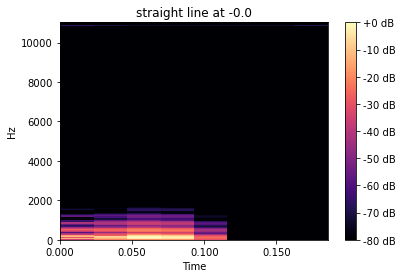

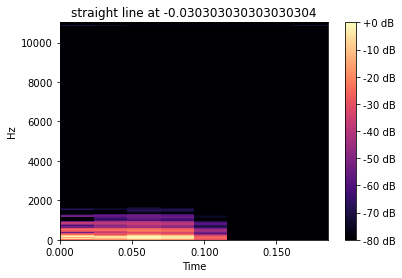

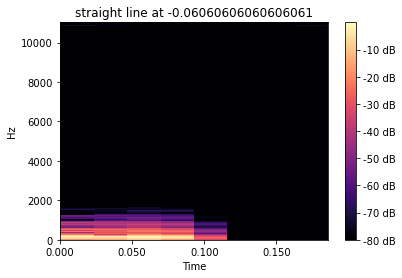

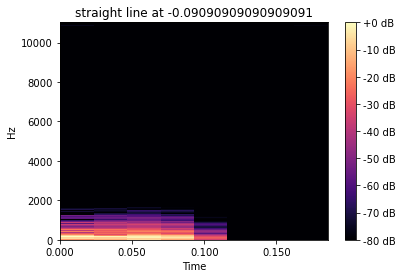

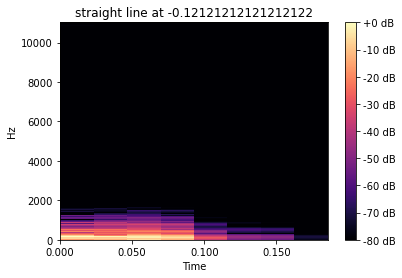

...

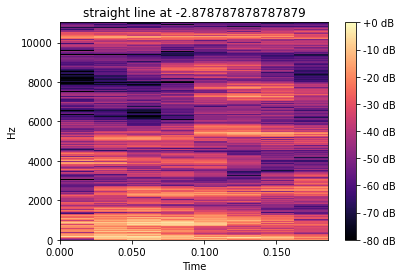

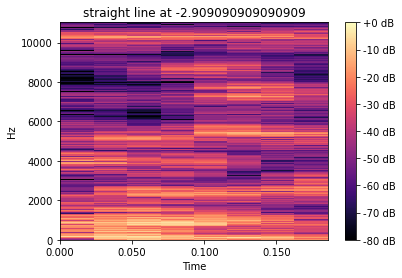

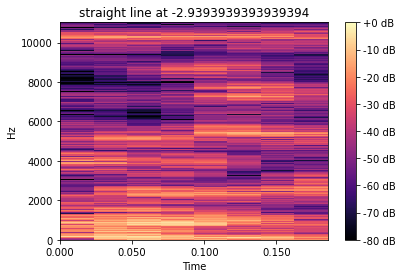

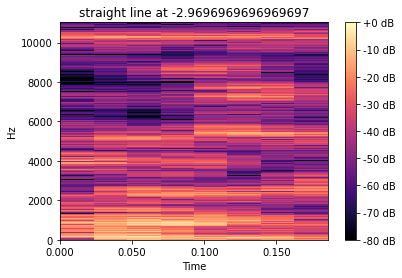

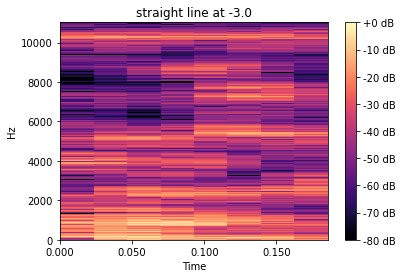

In [6]:
NFFT =  int(1022/8)
sroriginal1 = 16000
from numpy import linspace as lin
savepath = 'C:/Users/erikv/Desktop/IP/spectograms'
my_path = os.path.abspath(savepath)
X = lin(1,1,256)
for m in lin(0,3,100):
    probe = -m*X #iven function (in this case a sine function)
    #for i in range*(255,256): #here I can modify certain values to follow a different function
        #probe[i] = -2*np.cos(X[i])
    #plt.plot(lin(0,256,256),probe)
    #plt.plot(lin(0,256,256),lin(0,0,256))


    shortened_vector = probe #then i use this modified vector and run it through all the decoders and the inverse 
                             #spectogram function
    reshaped_vector = np.array([reshaper(np.array([probe]))])
    decoded_arrayfromvect = np.array([decoder(reshaped_vector[0])])
    decoded_audiofromvect = irosaspec(decoded_arrayfromvect[0,0],NFFT)

    y, sr = decoded_audiofromvect, sroriginal1
    D = lr.amplitude_to_db(np.abs(lr.stft(y)), ref=np.max)
    fig, ax = plt.subplots()
    img = lr.display.specshow(D, x_axis='time', y_axis='linear', ax=ax)
    ax.set(title='straight line at '+str(-m))
    fig.colorbar(img, ax=ax, format="%+2.f dB")
    my_file =str(int(m*100))+'.png'
    plt.savefig(os.path.join(my_path, my_file))

In [7]:
print (probe)

[3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3.
 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3.
 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3.
 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3.
 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3.
 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3.
 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3.
 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3.
 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3.
 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3.
 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3.]
